In [76]:
# Import TensorFlow and Keras libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (
    Dense, Flatten, Dropout, Conv2D, MaxPooling2D, BatchNormalization
)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array

# Import data handling and preprocessing libraries
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.preprocessing import LabelEncoder

# Import visualization libraries
import matplotlib.pyplot as plt

# Import OS for file path handling
import os

In [77]:
train_dir = "https://github.com/Bishwaprotapi/Fruits_fresh_and-rotten_Using_CNN/tree/main/dataset/train"
test_dir = "https://github.com/Bishwaprotapi/Fruits_fresh_and-rotten_Using_CNN/tree/main/dataset/test"

In [78]:
# Custom preprocessing function using CLAHE and Bilateral Filter
def preprocess_image(img):
    img = cv2.resize(img, (128, 128))
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    lab = cv2.merge((cl, a, b))
    img = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    img = cv2.bilateralFilter(img, 9, 75, 75)
    return img

In [79]:
# Wrapper for ImageDataGenerator to apply custom preprocessing
def custom_preprocessing(img):
    img = (img * 255).astype('uint8')  # Revert from float32 to uint8 before OpenCV
    img = preprocess_image(img)
    return img / 255.0  # Normalize again

In [80]:
import requests
import zipfile
import os # os is already imported in cell 1, but good practice to include if used heavily in a block

# Define local paths for the dataset
dataset_local_path = './dataset'
train_local_path = os.path.join(dataset_local_path, 'train')
test_local_path = os.path.join(dataset_local_path, 'test')

# Check if dataset already exists locally
if not os.path.exists(train_local_path) or not os.path.exists(test_local_path):
    print("Dataset not found locally. Attempting to download and extract...")
    
    # URL for the entire repository as a zip file
    repo_zip_url = "https://github.com/Bishwaprotapi/Fruits_fresh_and-rotten_Using_CNN/archive/refs/heads/main.zip"
    zip_filename = "Fruits_fresh_and-rotten_Using_CNN-main.zip"
    extracted_repo_folder = "Fruits_fresh_and-rotten_Using_CNN-main"
    
    # Download the zip file if it doesn't exist
    if not os.path.exists(zip_filename):
        print(f"Downloading {repo_zip_url}...")
        try:
            r = requests.get(repo_zip_url, stream=True)
            r.raise_for_status() # Raise an exception for HTTP errors
            with open(zip_filename, 'wb') as fd:
                for chunk in r.iter_content(chunk_size=8192): # Increased chunk size for efficiency
                    fd.write(chunk)
            print(f"Downloaded {zip_filename}")
        except requests.exceptions.RequestException as e:
            print(f"Error downloading dataset: {e}")
            print("Please ensure you have an internet connection and the URL is correct.")
            raise # Re-raise the exception to stop execution if download fails
    else:
        print(f"{zip_filename} already exists.")

    # Extract the zip file
    if not os.path.exists(extracted_repo_folder):
        print(f"Extracting {zip_filename}...")
        try:
            with zipfile.ZipFile(zip_filename, 'r') as zip_ref:
                zip_ref.extractall('.')
            print(f"Extracted to {extracted_repo_folder}")
        except zipfile.BadZipFile:
            print(f"Error: {zip_filename} is a bad zip file. Please delete it and try again.")
            raise # Re-raise the exception if zip is corrupt
    else:
        print(f"{extracted_repo_folder} already exists.")

    # Move the 'dataset' folder to the root if it's not already there
    source_dataset_path = os.path.join(extracted_repo_folder, 'dataset')
    if os.path.exists(source_dataset_path) and not os.path.exists(dataset_local_path):
        print(f"Moving '{source_dataset_path}' to '{dataset_local_path}'...")
        os.rename(source_dataset_path, dataset_local_path)
        print("Dataset moved successfully.")
    elif os.path.exists(dataset_local_path):
        print(f"Dataset folder '{dataset_local_path}' already exists.")
    else:
        # If dataset is not found after extraction, it's a critical error
        error_message = (
            f"Error: Could not find 'dataset' folder inside '{extracted_repo_folder}'. "
            "Please check the extracted structure or the repository content."
        )
        print(error_message)
        raise FileNotFoundError(error_message)
else:
    print("Dataset already exists locally.")

# Redefine train_dir and test_dir to point to the local paths
# This overrides the URL paths defined in cell 2 for the scope of this cell.
train_dir = train_local_path
test_dir = test_local_path

# Cell 3: Create ImageDataGenerators (same preprocessing for both train and test)
train_datagen = ImageDataGenerator(preprocessing_function=custom_preprocessing)
test_datagen = ImageDataGenerator(preprocessing_function=custom_preprocessing)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical'
)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical'
)

Dataset already exists locally.
Found 10901 images belonging to 6 classes.
Found 2698 images belonging to 6 classes.


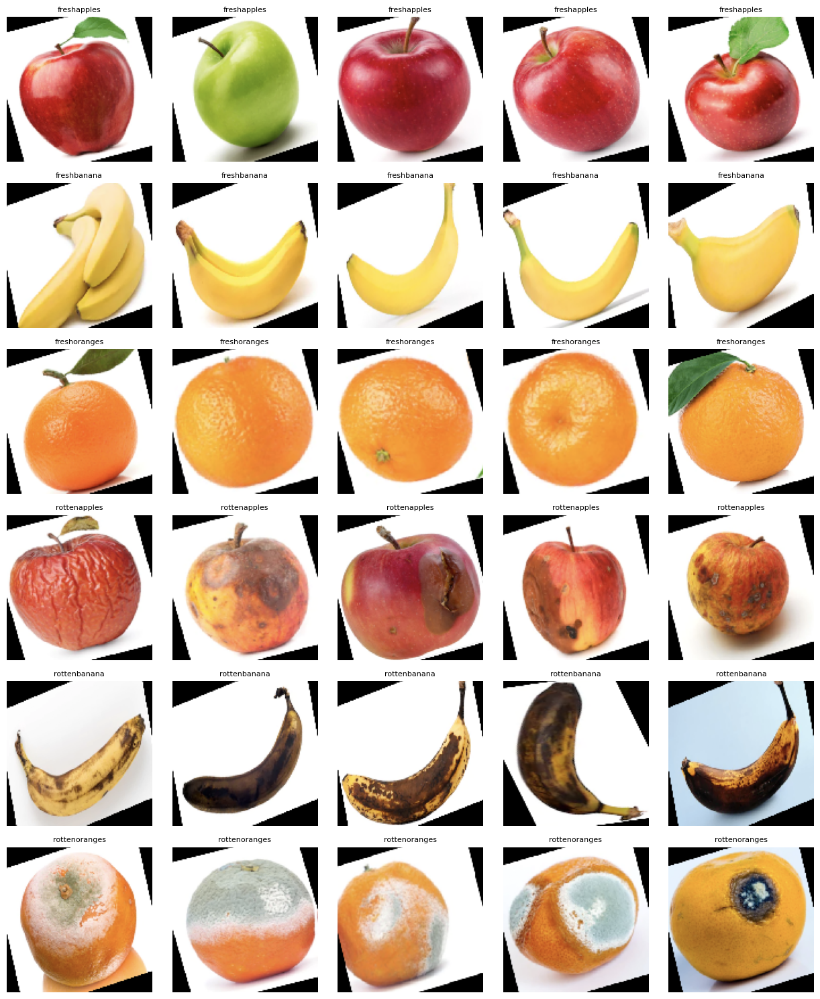

In [81]:
# Get class names from the train directory
class_names = sorted(os.listdir(train_dir)) # Sort for consistent order
num_classes = len(class_names)
num_images_to_show_per_class = 5

# Calculate figure size dynamically based on the number of classes and images per class
# Adjust these values (e.g., 2.5) as needed for better visualization
fig_width = num_images_to_show_per_class * 2.5
fig_height = num_classes * 2.5

# Create subplots, ensuring 'axes' is always a 2D array for consistent indexing
fig, axes = plt.subplots(num_classes, num_images_to_show_per_class, figsize=(fig_width, fig_height), squeeze=False)

# Iterate through each class
for class_idx, class_name in enumerate(class_names):
    class_path = os.path.join(train_dir, class_name)
    
    # Get all image files in the directory for the current class
    # Filter to ensure only common image file extensions are considered
    all_img_names = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]
    
    # Select the first 'num_images_to_show_per_class' images
    # If a class has fewer images than requested, it will take all available
    selected_img_names = all_img_names[:num_images_to_show_per_class]

    # Iterate through the selected images for the current class
    for img_idx, img_name in enumerate(selected_img_names):
        img_path = os.path.join(class_path, img_name)

        # Load image and preprocess for display (normalize pixel values)
        img = load_img(img_path, target_size=(128, 128))
        img = img_to_array(img) / 255.0

        # Plot the image on the corresponding subplot
        ax = axes[class_idx, img_idx]
        ax.imshow(img)
        ax.set_title(f"{class_name}", fontsize=8) # Title each image with its class name
        ax.axis('off') # Turn off axis labels and ticks
    
    # If a class has fewer than 'num_images_to_show_per_class' images,
    # turn off the axes for the remaining empty subplots in that row to keep it clean.
    for i in range(len(selected_img_names), num_images_to_show_per_class):
        ax = axes[class_idx, i]
        ax.axis('off')

plt.tight_layout() # Adjust subplot parameters for a tight layout
plt.show() # Display the figure

In [82]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import pandas as pd
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [83]:
# Helper function to get image counts per class in a given directory
def get_class_counts(directory, class_names):
    counts = {name: 0 for name in class_names}
    for class_name in class_names:
        class_path = os.path.join(directory, class_name)
        if os.path.exists(class_path):
            # Filter to ensure only common image file extensions are considered
            img_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]
            counts[class_name] = len(img_files)
    return counts

In [84]:
# Helper function to get all image paths for a directory
def get_all_image_paths(directory, class_names):
    all_paths = []
    for class_name in class_names:
        class_path = os.path.join(directory, class_name)
        if os.path.exists(class_path):
            img_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]
            for img_file in img_files:
                all_paths.append(os.path.join(class_path, img_file))
    return all_paths

# Assuming 'train_dir', 'val_dir', 'test_dir', and 'class_names' are defined in previous cells.

C:\Users\USER\AppData\Local\Temp\ipykernel_27760\959673494.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(train_counts.keys()), y=list(train_counts.values()), palette='viridis')


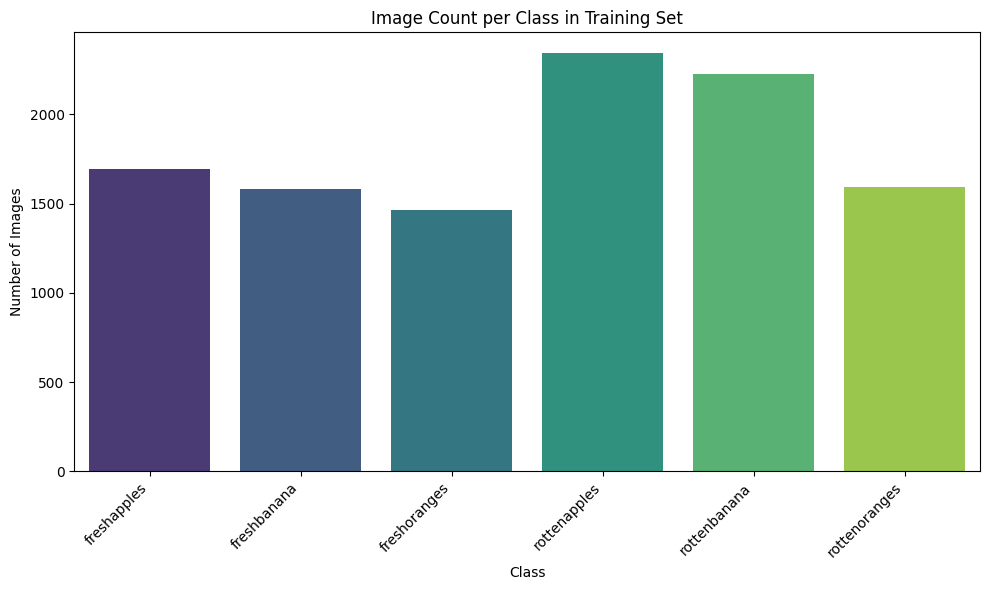

In [85]:
# Class Distribution - Training Set
train_counts = get_class_counts(train_dir, class_names)
plt.figure(figsize=(10, 6))
sns.barplot(x=list(train_counts.keys()), y=list(train_counts.values()), palette='viridis')
plt.title('Image Count per Class in Training Set')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

C:\Users\USER\AppData\Local\Temp\ipykernel_27760\463028565.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(test_counts.keys()), y=list(test_counts.values()), palette='viridis')


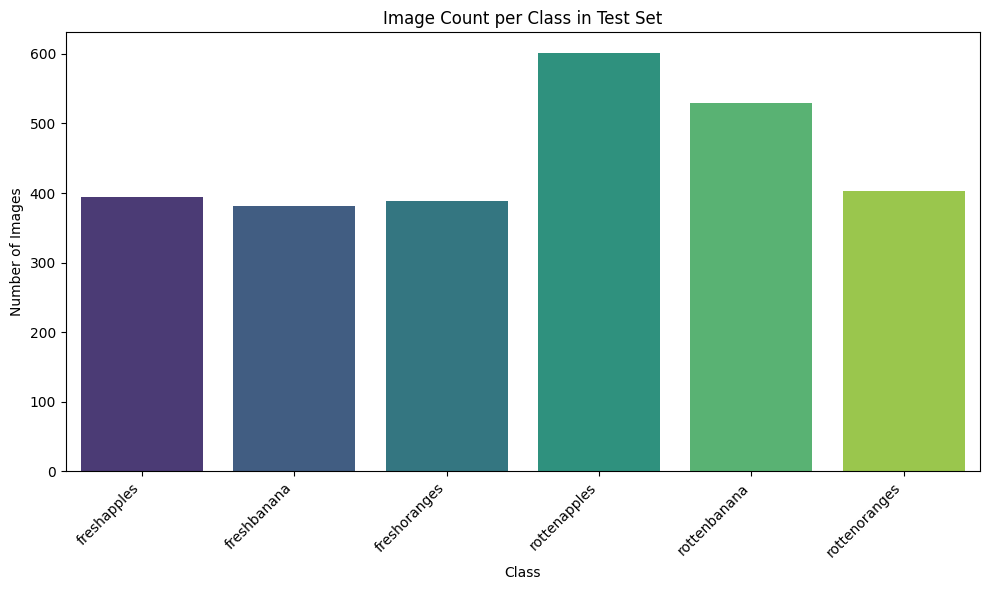

In [86]:
# Class Distribution - Test Set
test_counts = get_class_counts(test_dir, class_names)
plt.figure(figsize=(10, 6))
sns.barplot(x=list(test_counts.keys()), y=list(test_counts.values()), palette='viridis')
plt.title('Image Count per Class in Test Set')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


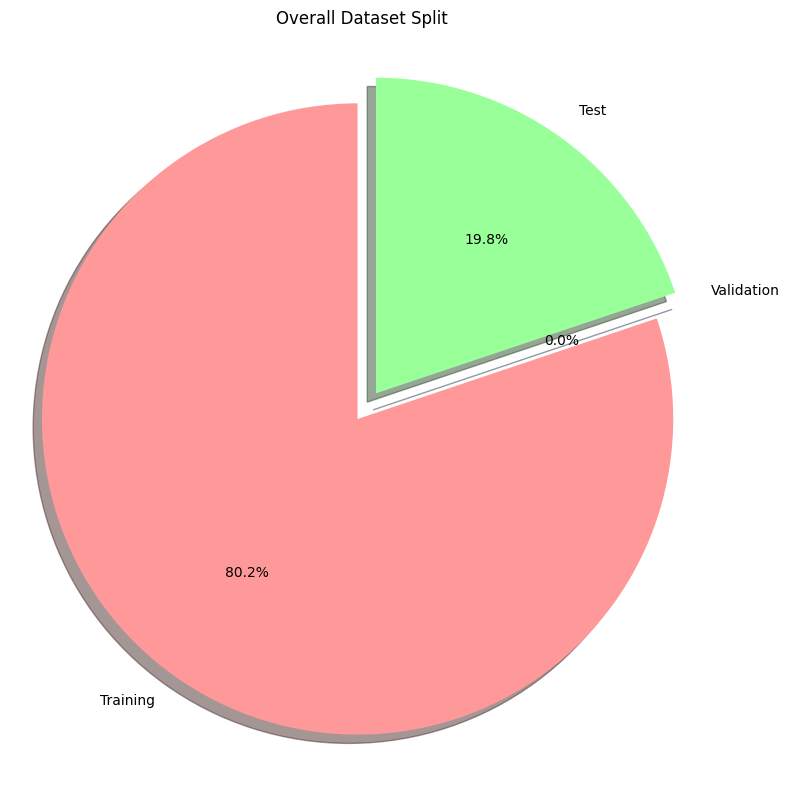

In [87]:
# Overall Dataset Split (Pie Chart)
total_train = sum(train_counts.values())
total_val = sum(val_counts.values())
total_test = sum(test_counts.values())

labels = ['Training', 'Validation', 'Test']
sizes = [total_train, total_val, total_test]
colors = ['#ff9999','#66b3ff','#99ff99']
explode = (0.05, 0.05, 0.05) # Slightly explode slices for emphasis

plt.figure(figsize=(8, 8))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',
        shadow=True, startangle=90)
plt.axis('equal') # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Overall Dataset Split')
plt.tight_layout()
plt.show()

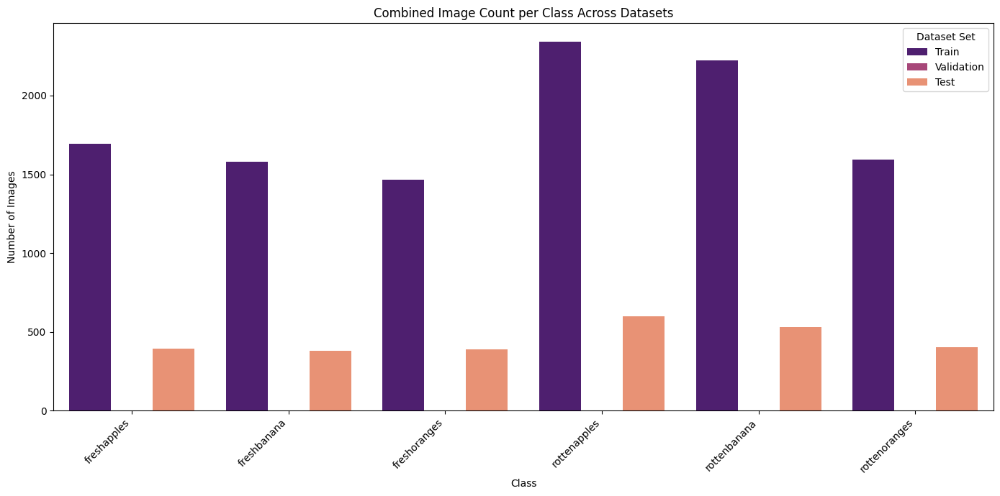

In [88]:
# Combined Class Distribution (Train, Val, Test)
df_train = pd.DataFrame({'Class': list(train_counts.keys()), 'Count': list(train_counts.values()), 'Set': 'Train'})
df_val = pd.DataFrame({'Class': list(val_counts.keys()), 'Count': list(val_counts.values()), 'Set': 'Validation'})
df_test = pd.DataFrame({'Class': list(test_counts.keys()), 'Count': list(test_counts.values()), 'Set': 'Test'})

df_combined = pd.concat([df_train, df_val, df_test])

plt.figure(figsize=(14, 7))
sns.barplot(x='Class', y='Count', hue='Set', data=df_combined, palette='magma')
plt.title('Combined Image Count per Class Across Datasets')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Dataset Set')
plt.tight_layout()
plt.show()

C:\Users\USER\AppData\Local\Temp\ipykernel_27760\3139772138.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(total_counts_per_split.keys()), y=list(total_counts_per_split.values()), palette='pastel')


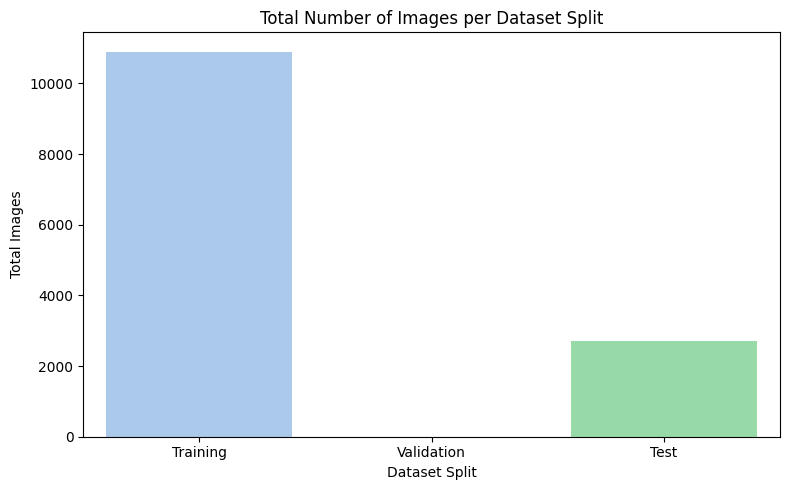

In [89]:
# Total Images per Split (Bar Chart)
total_counts_per_split = {'Training': total_train, 'Validation': total_val, 'Test': total_test}
plt.figure(figsize=(8, 5))
sns.barplot(x=list(total_counts_per_split.keys()), y=list(total_counts_per_split.values()), palette='pastel')
plt.title('Total Number of Images per Dataset Split')
plt.xlabel('Dataset Split')
plt.ylabel('Total Images')
plt.tight_layout()
plt.show()

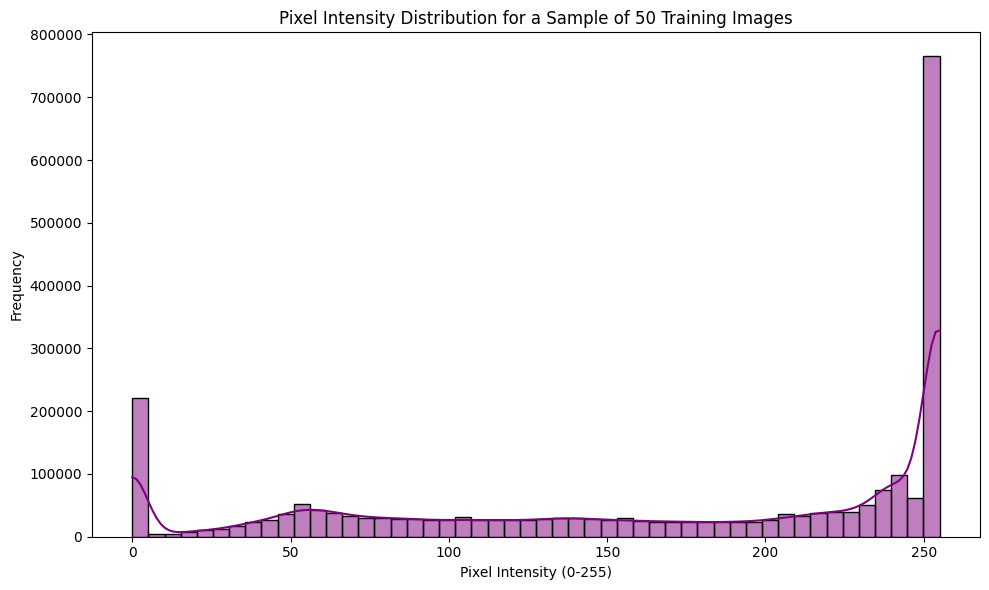

In [90]:
#Pixel Intensity Histogram (Overall Sample)
# Load a random sample of images from the training set and plot their aggregated pixel intensity distribution
sample_size = 50 # Number of images to sample for this visualization
all_train_image_paths = get_all_image_paths(train_dir, class_names)
np.random.shuffle(all_train_image_paths)
sampled_paths = all_train_image_paths[:min(sample_size, len(all_train_image_paths))]

pixel_intensities = []
for img_path in sampled_paths:
    img = load_img(img_path, target_size=(128, 128))
    img_array = img_to_array(img) # Keep original 0-255 range for intensity
    pixel_intensities.extend(img_array.flatten()) # Flatten all channels into a single list

plt.figure(figsize=(10, 6))
sns.histplot(pixel_intensities, bins=50, kde=True, color='purple')
plt.title(f'Pixel Intensity Distribution for a Sample of {len(sampled_paths)} Training Images')
plt.xlabel('Pixel Intensity (0-255)')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

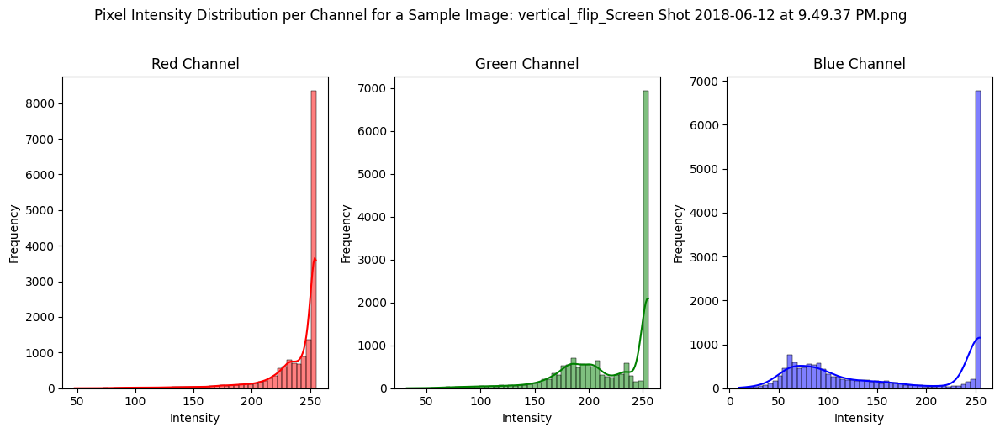

In [91]:
# Pixel Intensity Histogram (Per Channel for a Sample Image)
if sampled_paths:
    sample_img_path = sampled_paths[0] # Take the first sampled image
    img = load_img(sample_img_path, target_size=(128, 128))
    img_array = img_to_array(img)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 1)
    sns.histplot(img_array[:,:,0].flatten(), bins=50, kde=True, color='red')
    plt.title('Red Channel')
    plt.xlabel('Intensity')
    plt.ylabel('Frequency')

    plt.subplot(1, 3, 2)
    sns.histplot(img_array[:,:,1].flatten(), bins=50, kde=True, color='green')
    plt.title('Green Channel')
    plt.xlabel('Intensity')
    plt.ylabel('Frequency')

    plt.subplot(1, 3, 3)
    sns.histplot(img_array[:,:,2].flatten(), bins=50, kde=True, color='blue')
    plt.title('Blue Channel')
    plt.xlabel('Intensity')
    plt.ylabel('Frequency')

    plt.suptitle(f'Pixel Intensity Distribution per Channel for a Sample Image: {os.path.basename(sample_img_path)}', y=1.02)
    plt.tight_layout()
    plt.show()
else:
    print("No images found in the sample to plot per-channel intensity histogram.")

C:\Users\USER\AppData\Local\Temp\ipykernel_27760\3260764021.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Class', y='Brightness', data=df_brightness, palette='coolwarm')


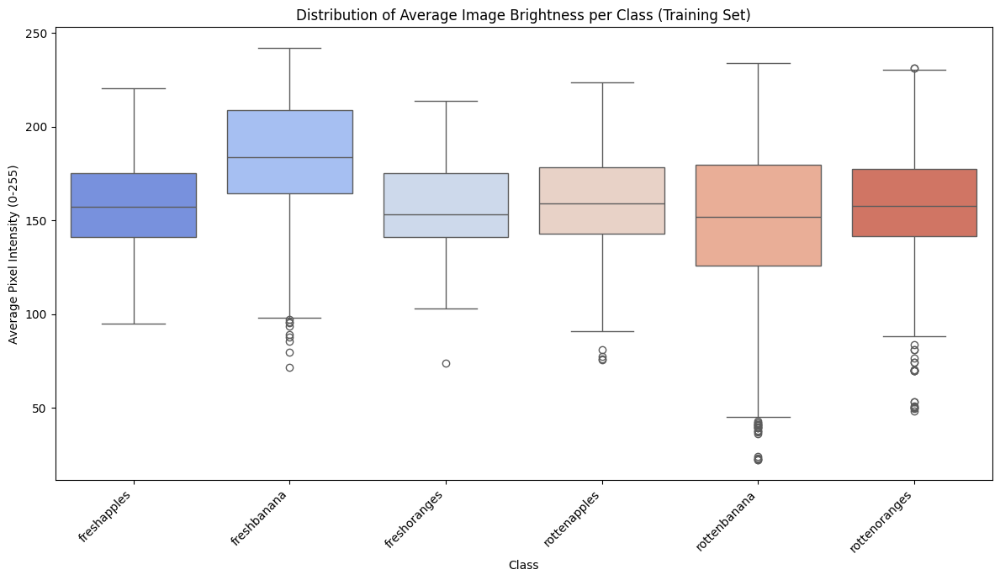

In [92]:
# Average Image Brightness per Class (Training Set)
# Calculate mean pixel value for each image in the training set
brightness_data = []
for class_name in class_names:
    class_path = os.path.join(train_dir, class_name)
    if os.path.exists(class_path):
        img_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]
        for img_file in img_files:
            img_path = os.path.join(class_path, img_file)
            img = load_img(img_path, target_size=(128, 128))
            img_array = img_to_array(img)
            mean_brightness = np.mean(img_array) # Average across all pixels and channels
            brightness_data.append({'Class': class_name, 'Brightness': mean_brightness})

if brightness_data:
    df_brightness = pd.DataFrame(brightness_data)
    plt.figure(figsize=(12, 7))
    sns.boxplot(x='Class', y='Brightness', data=df_brightness, palette='coolwarm')
    plt.title('Distribution of Average Image Brightness per Class (Training Set)')
    plt.xlabel('Class')
    plt.ylabel('Average Pixel Intensity (0-255)')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
else:
    print("No brightness data to plot.")

In [127]:
# Cell 4: Build the CNN model
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(6, activation='softmax')  # 6 output classes
])

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

h:\BT\Fruits_fresh_and-rotten_Using_CNN\.venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [129]:
# Cell 5: Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=test_generator,
    validation_steps=test_generator.samples // test_generator.batch_size,
    epochs=3 
)


Epoch 1/3
340/340 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - accuracy: 0.8479 - loss: 0.4332 - val_accuracy: 0.8765 - val_loss: 0.3111
Epoch 2/3
340/340 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - accuracy: 0.9062 - loss: 0.1542 - val_accuracy: 0.8802 - val_loss: 0.3191
Epoch 3/3
340/340 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - accuracy: 0.9292 - loss: 0.2001 - val_accuracy: 0.9379 - val_loss: 0.1819


In [130]:
print(f"Training Accuracy: {history.history['accuracy'][-1]:.4f}")
print(f"Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}")

Training Accuracy: 0.9292
Validation Accuracy: 0.9379


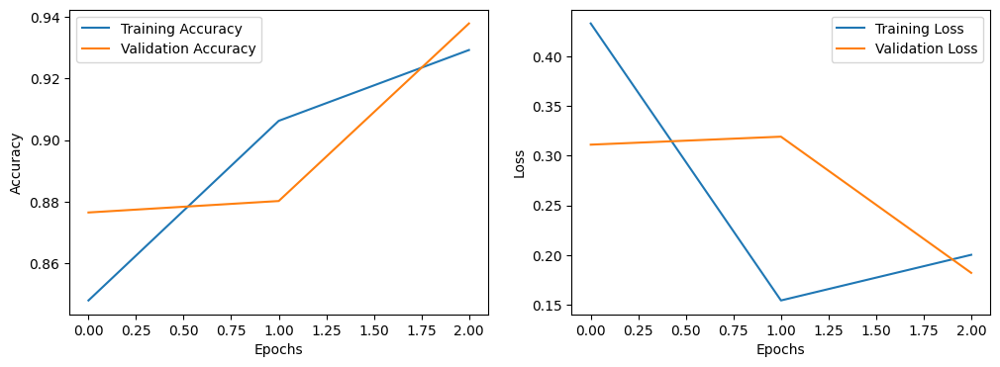

In [131]:
# === Plot Accuracy and Loss ===
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 4))
# Plot Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

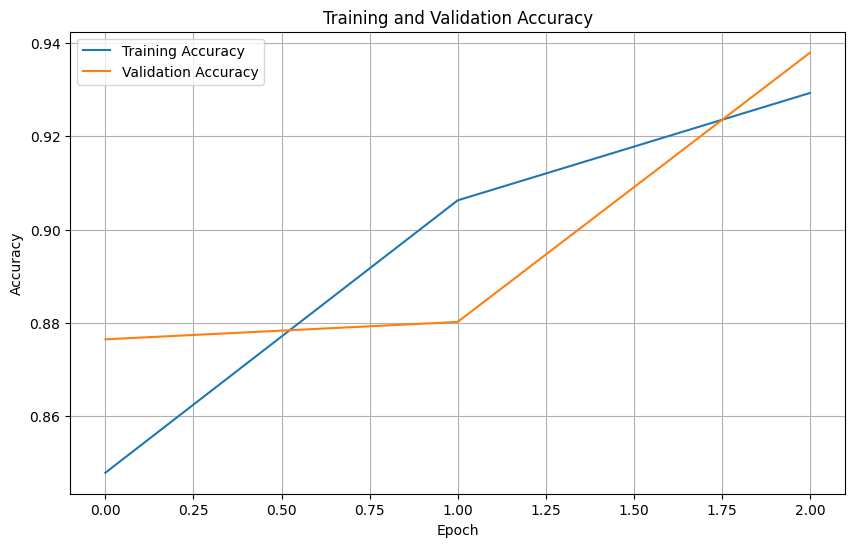

In [132]:
#Plot Training & Validation Accuracy
plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

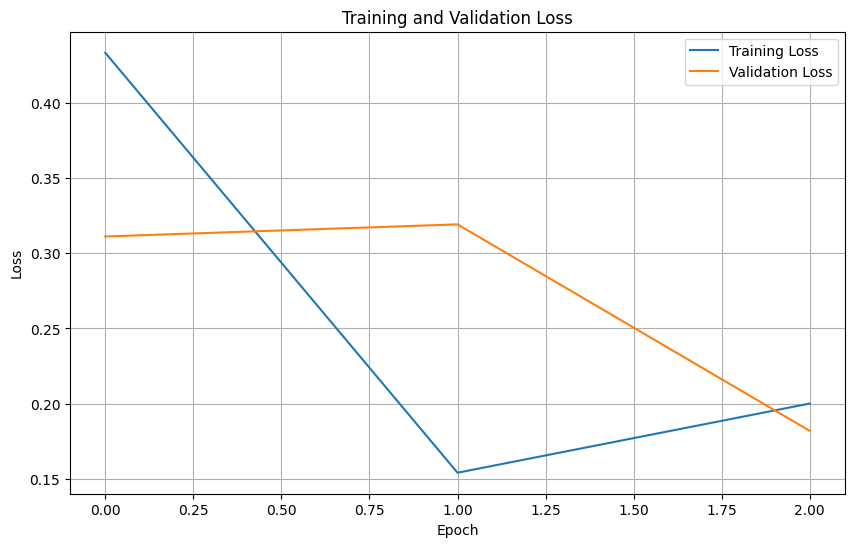

In [133]:
#Plot Training & Validation Loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

In [135]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf


if hasattr(test_generator, 'target_size'):
    img_height, img_width = test_generator.target_size
else:

    print("Warning: Could not infer img_height, img_width from test_generator. Using default (224, 224).")
    img_height, img_width = 224, 224

In [136]:
# Get predictions from the model on the test set
# Reset the generator to ensure the order of samples matches the true_classes
test_generator.reset()
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step 


In [137]:
# 2. Get true labels for the test set
true_classes = test_generator.classes

In [138]:
# 3. Get class names from the generator's class_indices
class_names = list(test_generator.class_indices.keys())

In [140]:
# 4. Find indices of correctly predicted samples
correct_indices = np.where(predicted_classes == true_classes)[0]

In [141]:
# 5. Select up to 20 random correctly predicted samples
np.random.shuffle(correct_indices)
display_indices = correct_indices[:20]

Displaying 20 correctly predicted samples:


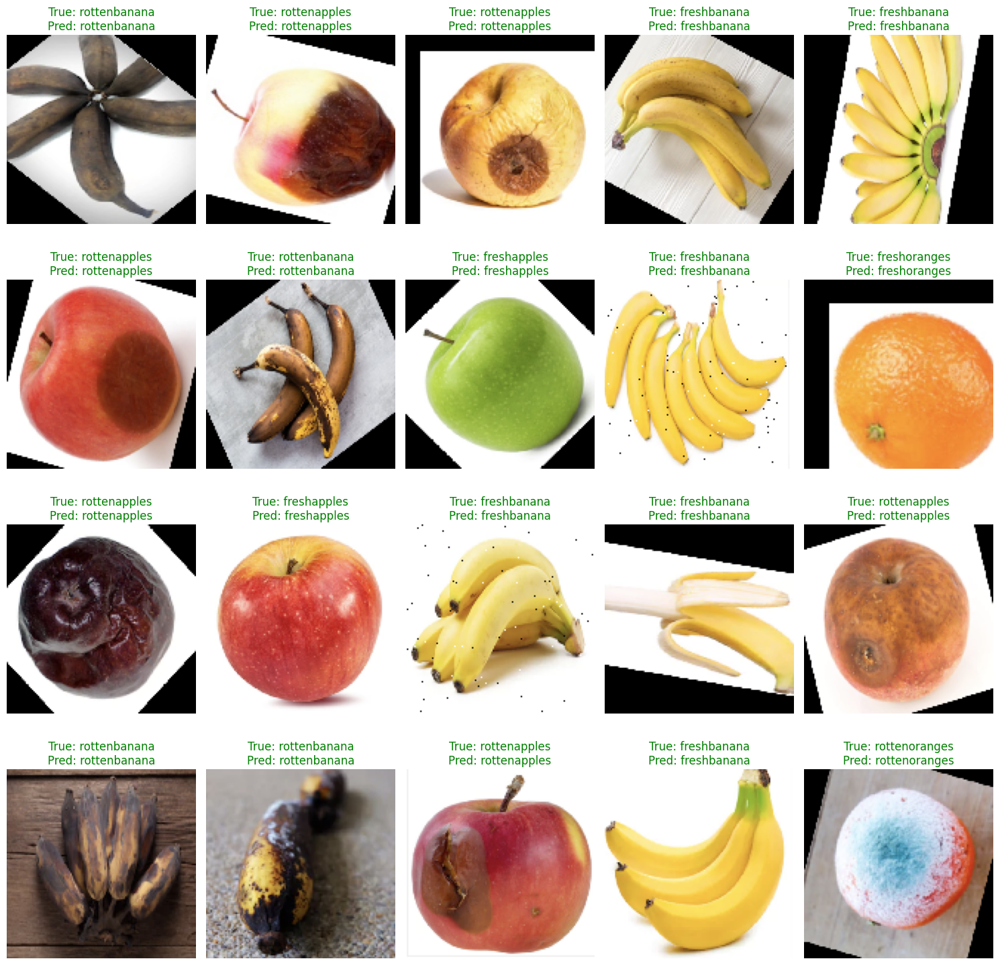

In [143]:
print(f"Displaying {len(display_indices)} correctly predicted samples:")

# 6. Plot these samples
plt.figure(figsize=(15, 15))
for i, idx in enumerate(display_indices):
    plt.subplot(4, 5, i + 1) # Arrange in a 4x5 grid

    # Get the image path from the generator's filepaths
    img_path = test_generator.filepaths[idx]

    # Load the image using TensorFlow's utility
    img = tf.keras.utils.load_img(img_path, target_size=(img_height, img_width))
    img_array = tf.keras.utils.img_to_array(img)

    # Display the image. Convert to uint8 for correct color display if values are 0-255.
    # If images were normalized to [0,1] during preprocessing, img_array would be float.
    # plt.imshow handles both float [0,1] and uint8 [0,255].
    plt.imshow(img_array.astype('uint8'))

    # Get true and predicted labels
    true_label = class_names[true_classes[idx]]
    predicted_label = class_names[predicted_classes[idx]]

    plt.title(f"True: {true_label}\nPred: {predicted_label}", color='green')
    plt.axis('off')

plt.tight_layout()
plt.show()



--- Visualizing Incorrectly Predicted Samples ---
Displaying 20 incorrectly predicted samples:


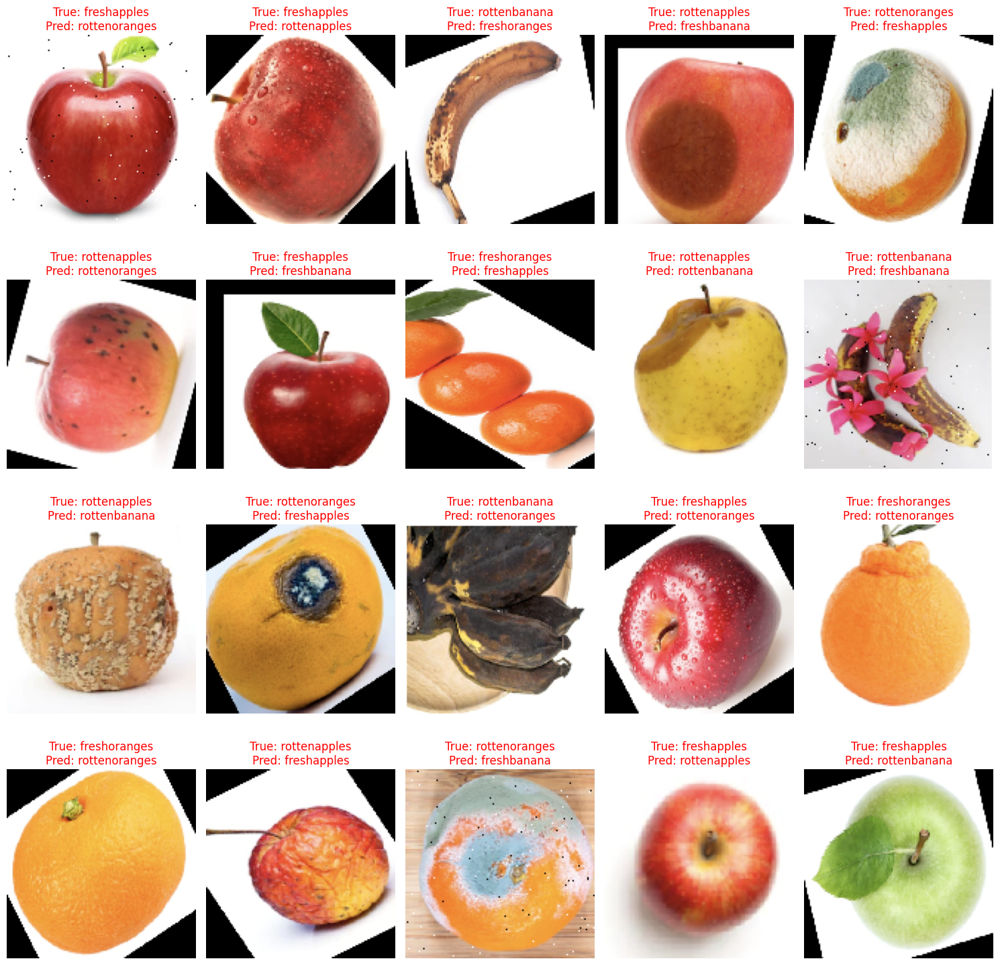

In [144]:
print("\n--- Visualizing Incorrectly Predicted Samples ---")

# 1. Find indices of incorrectly predicted samples
incorrect_indices = np.where(predicted_classes != true_classes)[0]

# 2. Select up to 20 random incorrectly predicted samples
np.random.shuffle(incorrect_indices)
display_incorrect_indices = incorrect_indices[:20]

print(f"Displaying {len(display_incorrect_indices)} incorrectly predicted samples:")

# 3. Plot these samples
plt.figure(figsize=(15, 15))
for i, idx in enumerate(display_incorrect_indices):
    plt.subplot(4, 5, i + 1) # Arrange in a 4x5 grid

    # Get the image path from the generator's filepaths
    img_path = test_generator.filepaths[idx]

    # Load the image using TensorFlow's utility
    img = tf.keras.utils.load_img(img_path, target_size=(img_height, img_width))
    img_array = tf.keras.utils.img_to_array(img)

    # Display the image
    plt.imshow(img_array.astype('uint8'))

    # Get true and predicted labels
    true_label = class_names[true_classes[idx]]
    predicted_label = class_names[predicted_classes[idx]]

    plt.title(f"True: {true_label}\nPred: {predicted_label}", color='red') # Red for incorrect predictions
    plt.axis('off')

plt.tight_layout()
plt.show()



--- Sample Images with Top 3 Predicted Classes and Probabilities ---
Recalculating predictions and true classes for visualization...
 1/85 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step

h:\BT\Fruits_fresh_and-rotten_Using_CNN\.venv\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step 


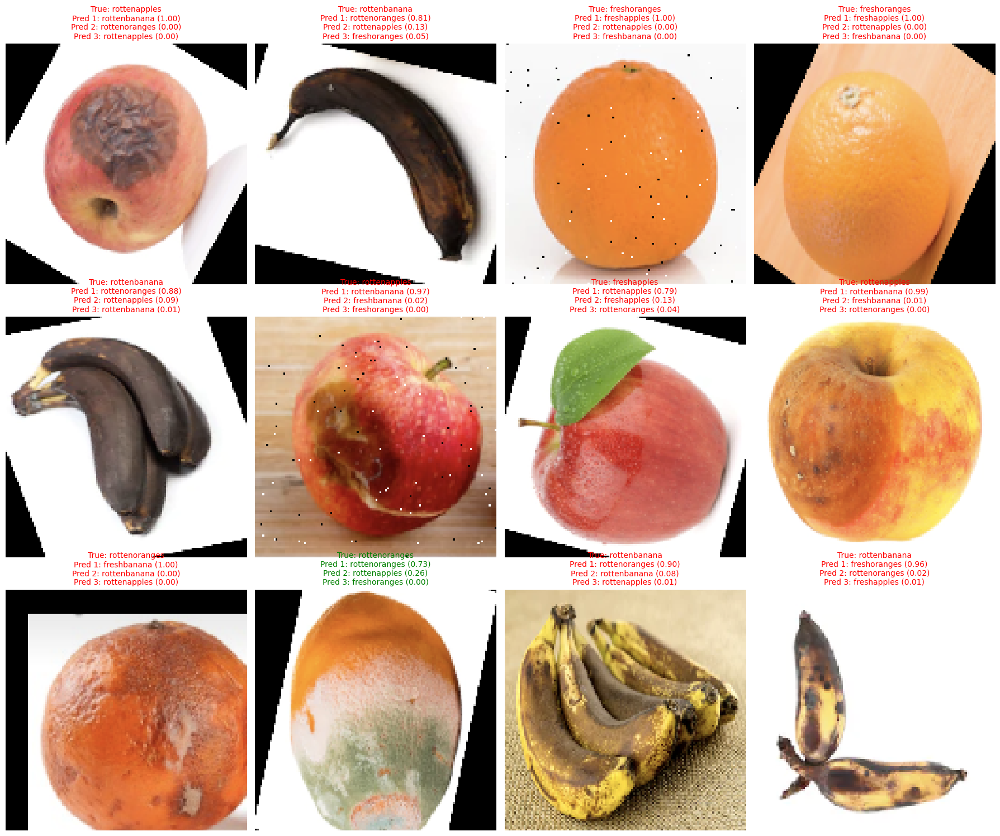

In [148]:
print("\n--- Sample Images with Top 3 Predicted Classes and Probabilities ---")

# Ensure predictions and true classes are available for this cell.
# This step is crucial if the previous cell (where predictions were made) was not run or its output was cleared.
# 'model' and 'test_generator' are assumed to be defined in earlier cells.
if 'predicted_probabilities' not in globals() or 'true_classes' not in globals():
    print("Recalculating predictions and true classes for visualization...")
    predicted_probabilities = model.predict(test_generator)
    true_classes = test_generator.classes # Get true labels from the generator

# Number of samples to display
num_samples_to_display = 12

# Randomly select indices from the test set
# Ensure we don't pick more samples than available in the test set
num_test_samples = len(test_generator.filepaths)
if num_samples_to_display > num_test_samples:
    num_samples_to_display = num_test_samples
    print(f"Adjusted number of samples to display to {num_samples_to_display} as there are only {num_test_samples} test samples.")

sample_indices = np.random.choice(num_test_samples, num_samples_to_display, replace=False)

plt.figure(figsize=(18, 15)) # Adjust figure size for better readability

for i, idx in enumerate(sample_indices):
    plt.subplot(3, 4, i + 1) # Arrange in a 3x4 grid

    # Get the image path from the generator's filepaths
    img_path = test_generator.filepaths[idx]

    # Load the image using TensorFlow's utility
    img = tf.keras.utils.load_img(img_path, target_size=(img_height, img_width))
    img_array = tf.keras.utils.img_to_array(img)

    # Display the image
    plt.imshow(img_array.astype('uint8'))
    plt.axis('off')

    # Get true label
    true_label = class_names[true_classes[idx]]

    # Get predicted probabilities for this image
    probs = predicted_probabilities[idx]

    # Get top 3 predicted classes and their probabilities
    # np.argsort returns indices that would sort an array. [::-1] reverses it for descending order.
    top_3_indices = np.argsort(probs)[::-1][:3]
    top_3_probs = probs[top_3_indices]
    top_3_class_names = [class_names[j] for j in top_3_indices]

    # Construct the title string
    title_text = f"True: {true_label}\n"
    for k in range(3):
        title_text += f"Pred {k+1}: {top_3_class_names[k]} ({top_3_probs[k]:.2f})\n"

    # Determine title color based on whether the top 1 prediction is correct
    title_color = 'green' if top_3_indices[0] == true_classes[idx] else 'red'

    plt.title(title_text.strip(), color=title_color, fontsize=10)

plt.tight_layout()
plt.show()


In [149]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.metrics import roc_curve, auc, precision_recall_curve, confusion_matrix, classification_report
from itertools import cycle
import tensorflow as tf
from tensorflow.keras.preprocessing import image # For image manipulation utilities

# --- Helper function to ensure df_image_data is available ---
def get_image_data_df(train_gen, test_gen, class_names_list, img_h, img_w):
    """Collects image dimensions and class labels into a DataFrame."""
    print("Collecting image dimensions for visualizations...")
    all_filepaths = train_gen.filepaths + test_gen.filepaths
    all_labels_indices = list(train_gen.classes) + list(test_gen.classes)
    all_labels = [class_names_list[i] for i in all_labels_indices]

    widths = []
    heights = []
    for img_path in all_filepaths:
        try:
            img = tf.keras.utils.load_img(img_path)
            widths.append(img.width)
            heights.append(img.height)
        except Exception as e:
            print(f"Warning: Could not load image {img_path} for dimension collection: {e}")
            widths.append(np.nan)
            heights.append(np.nan)
    
    df = pd.DataFrame({'Width': widths, 'Height': heights, 'Class': all_labels})
    df.dropna(inplace=True) # Remove rows where image loading failed
    print(f"Collected dimensions for {len(df)} images.")
    return df

# Ensure df_image_data is available. If not, create it.
if 'df_image_data' not in locals() or df_image_data.empty:
    df_image_data = get_image_data_df(train_generator, test_generator, class_names, img_height, img_width)

Collected dimensions for 13599 images.


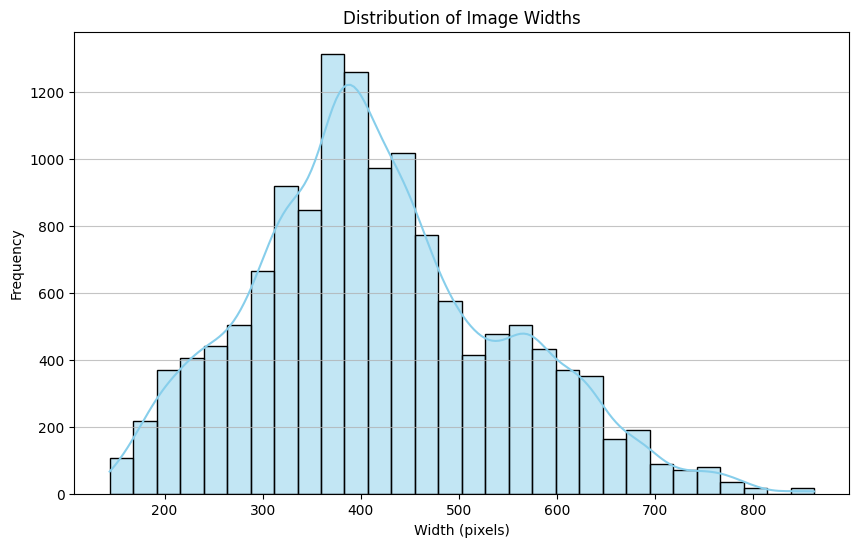

In [150]:
# Image Width Distribution (Histogram)
plt.figure(figsize=(10, 6))
sns.histplot(df_image_data['Width'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Image Widths')
plt.xlabel('Width (pixels)')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.show()

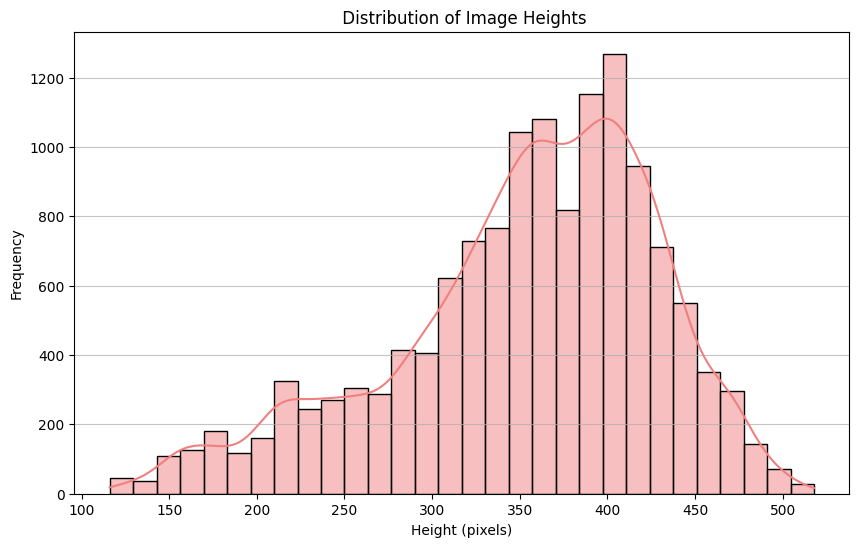

In [151]:
# Image Height Distribution (Histogram)
plt.figure(figsize=(10, 6))
sns.histplot(df_image_data['Height'], bins=30, kde=True, color='lightcoral')
plt.title(' Distribution of Image Heights')
plt.xlabel('Height (pixels)')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.show()

Calculating average RGB channel intensities per class...


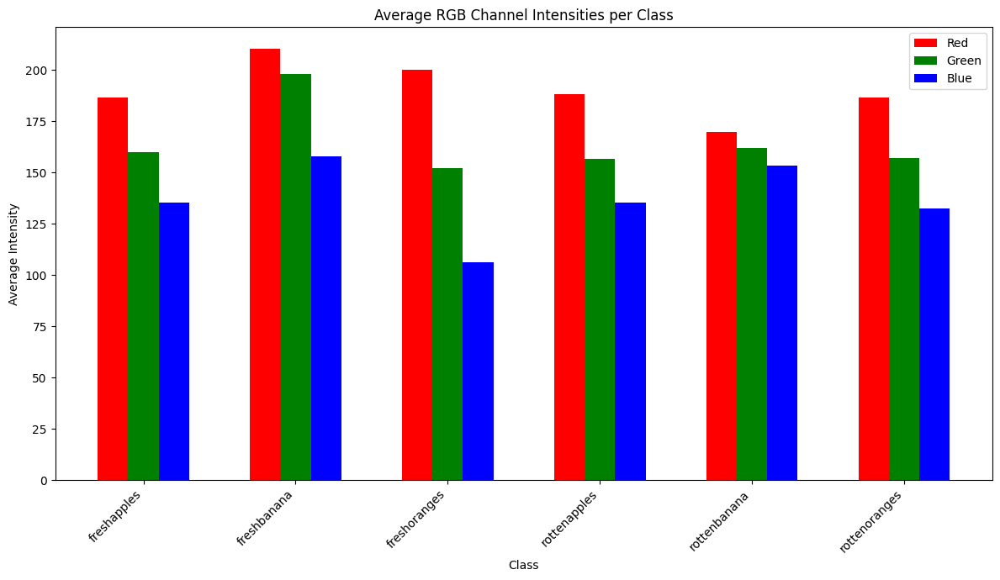

In [152]:
# Average RGB Channel Intensities per Class (Bar Plot)
print("Calculating average RGB channel intensities per class...")
rgb_data = []
num_samples_per_class = 50 # Limit samples to avoid long computation
for i, class_name in enumerate(class_names):
    class_indices = np.where(train_generator.classes == i)[0]
    sampled_indices = np.random.choice(class_indices, min(num_samples_per_class, len(class_indices)), replace=False)
    for idx in sampled_indices:
        img_path = train_generator.filepaths[idx]
        try:
            img = tf.keras.utils.load_img(img_path)
            img_array = tf.keras.utils.img_to_array(img)
            r_mean = img_array[:,:,0].mean()
            g_mean = img_array[:,:,1].mean()
            b_mean = img_array[:,:,2].mean()
            rgb_data.append({'Class': class_name, 'R': r_mean, 'G': g_mean, 'B': b_mean})
        except Exception as e:
            print(f"Warning: Could not load image {img_path} for RGB calculation: {e}")

if rgb_data:
    df_rgb = pd.DataFrame(rgb_data)
    avg_rgb_per_class = df_rgb.groupby('Class').mean().reset_index()

    plt.figure(figsize=(12, 7))
    bar_width = 0.2
    index = np.arange(len(class_names))

    plt.bar(index - bar_width, avg_rgb_per_class['R'], bar_width, label='Red', color='red')
    plt.bar(index, avg_rgb_per_class['G'], bar_width, label='Green', color='green')
    plt.bar(index + bar_width, avg_rgb_per_class['B'], bar_width, label='Blue', color='blue')

    plt.xlabel('Class')
    plt.ylabel('Average Intensity')
    plt.title('Average RGB Channel Intensities per Class')
    plt.xticks(index, class_names, rotation=45, ha='right')
    plt.legend()
    plt.tight_layout()
    plt.show()
else:
    print("Skipping Average RGB Channel Intensities per Class: No RGB data collected.")

Displaying sample images with augmentations...


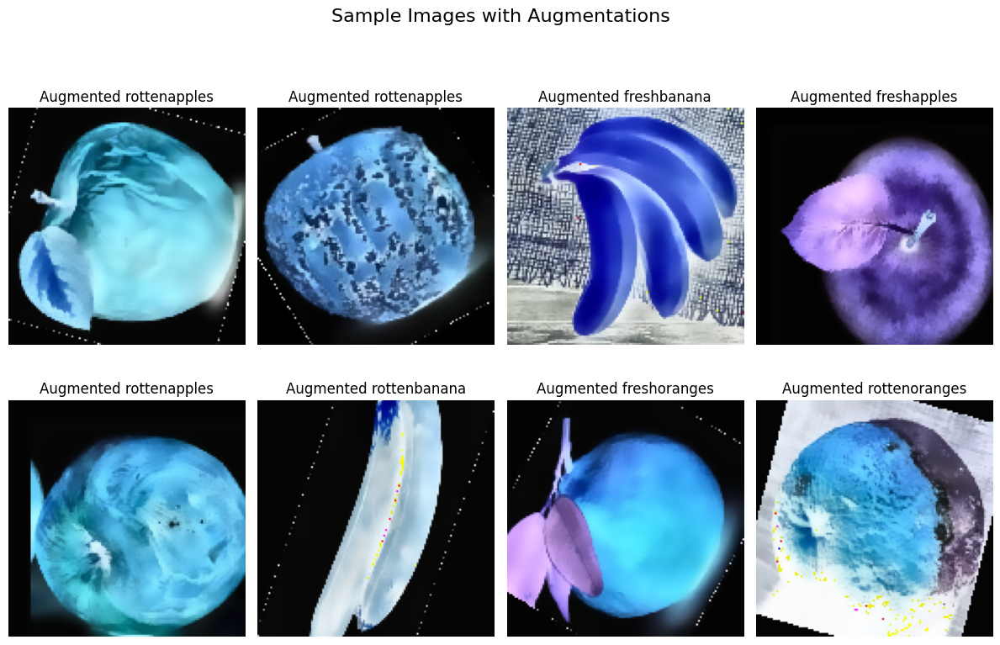

In [153]:
#  Sample Images with Augmentations (if ImageDataGenerator instance 'train_datagen' is available)
if 'train_datagen' in locals(): # Check if train_datagen was defined
    print("Displaying sample images with augmentations...")
    plt.figure(figsize=(12, 8))
    plt.suptitle('Sample Images with Augmentations', y=1.02, fontsize=16)
    for i in range(8): # Display 8 augmented images
        random_idx = np.random.randint(0, len(train_generator.filepaths))
        img_path = train_generator.filepaths[random_idx]
        try:
            img = tf.keras.utils.load_img(img_path, target_size=(img_height, img_width))
            x = tf.keras.utils.img_to_array(img)
            x = x.reshape((1,) + x.shape) # Reshape to (1, height, width, channels)

            # Generate one augmented image
            for batch in train_datagen.flow(x, batch_size=1):
                plt.subplot(2, 4, i + 1)
                plt.imshow(image.array_to_img(batch[0]))
                plt.title(f"Augmented {class_names[train_generator.classes[random_idx]]}")
                plt.axis('off')
                break # Only generate one augmented image per original image
        except Exception as e:
            print(f"Warning: Could not load/augment image {img_path}: {e}")
            plt.subplot(2, 4, i + 1)
            plt.text(0.5, 0.5, "Error", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
            plt.axis('off')
    plt.tight_layout()
    plt.show()
else:
    print("Skipping 1.4 Augmented Image Visualization: 'train_datagen' not found.")

Generating average image for each class...


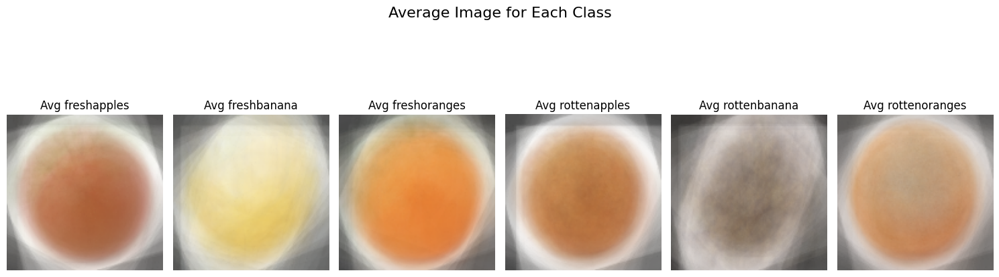

In [154]:
#  Average Image for each Class
print("Generating average image for each class...")
plt.figure(figsize=(15, 5))
plt.suptitle('Average Image for Each Class', y=1.02, fontsize=16)
for i, class_name in enumerate(class_names):
    class_indices = np.where(train_generator.classes == i)[0]
    sample_indices = np.random.choice(class_indices, min(100, len(class_indices)), replace=False) # Use up to 100 images
    
    avg_img_array = np.zeros((img_height, img_width, 3), dtype=np.float32)
    count = 0
    for idx in sample_indices:
        img_path = train_generator.filepaths[idx]
        try:
            img = tf.keras.utils.load_img(img_path, target_size=(img_height, img_width))
            img_array = tf.keras.utils.img_to_array(img)
            avg_img_array += img_array
            count += 1
        except Exception as e:
            print(f"Warning: Could not load image {img_path} for average image calculation: {e}")
    
    plt.subplot(1, len(class_names), i + 1)
    if count > 0:
        avg_img_array /= count
        avg_img_array = avg_img_array.astype('uint8') # Convert back to uint8 for display
        plt.imshow(avg_img_array)
        plt.title(f'Avg {class_name}')
    else:
        plt.text(0.5, 0.5, "No Images", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
        plt.title(f'Avg {class_name}')
        print(f"Warning: No images found for class {class_name} to compute average.")
    plt.axis('off')
plt.tight_layout()
plt.show()


C:\Users\USER\AppData\Local\Temp\ipykernel_27760\1819593558.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Class', y='Area', data=df_image_data, palette='viridis')


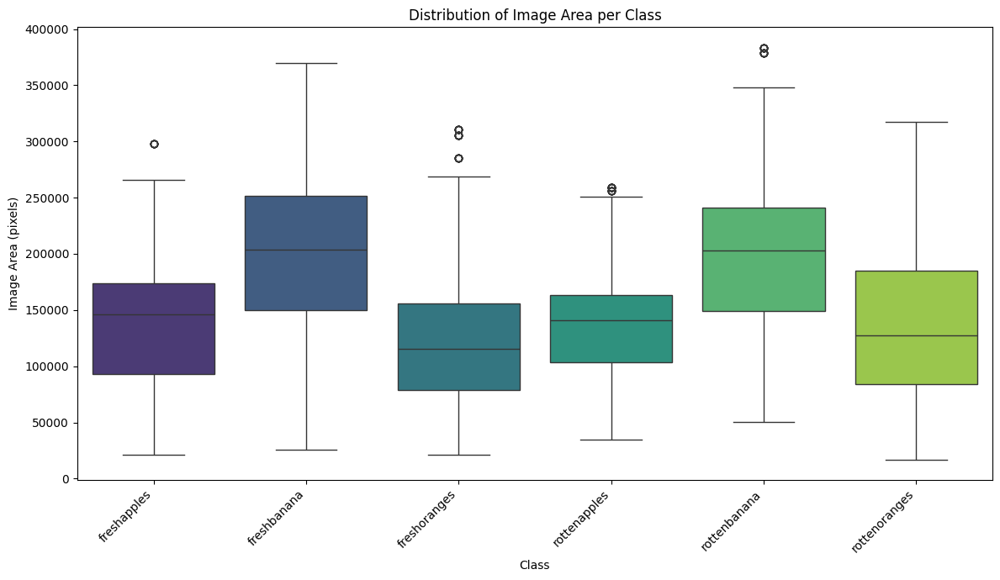

In [155]:
# Image Area Distribution per Class (Box Plot)
df_image_data['Area'] = df_image_data['Width'] * df_image_data['Height']
plt.figure(figsize=(12, 7))
sns.boxplot(x='Class', y='Area', data=df_image_data, palette='viridis')
plt.title('Distribution of Image Area per Class')
plt.xlabel('Class')
plt.ylabel('Image Area (pixels)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

C:\Users\USER\AppData\Local\Temp\ipykernel_27760\1130421107.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Class', y='Aspect_Ratio', data=df_image_data, palette='plasma')


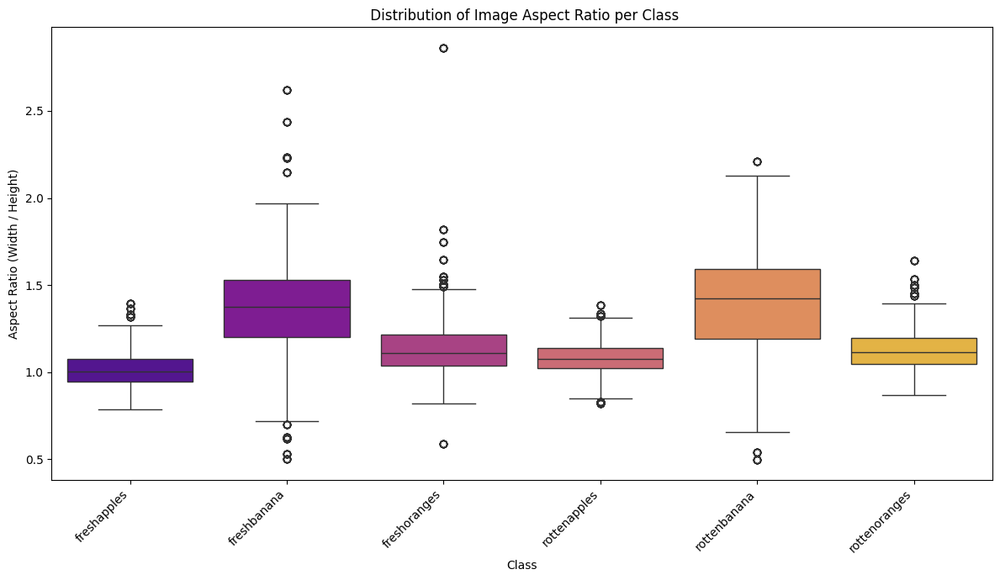

In [156]:
# Image Aspect Ratio Distribution per Class (Box Plot)
df_image_data['Aspect_Ratio'] = df_image_data['Width'] / df_image_data['Height']
plt.figure(figsize=(12, 7))
sns.boxplot(x='Class', y='Aspect_Ratio', data=df_image_data, palette='plasma')
plt.title(' Distribution of Image Aspect Ratio per Class')
plt.xlabel('Class')
plt.ylabel('Aspect Ratio (Width / Height)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Generating ROC curves...


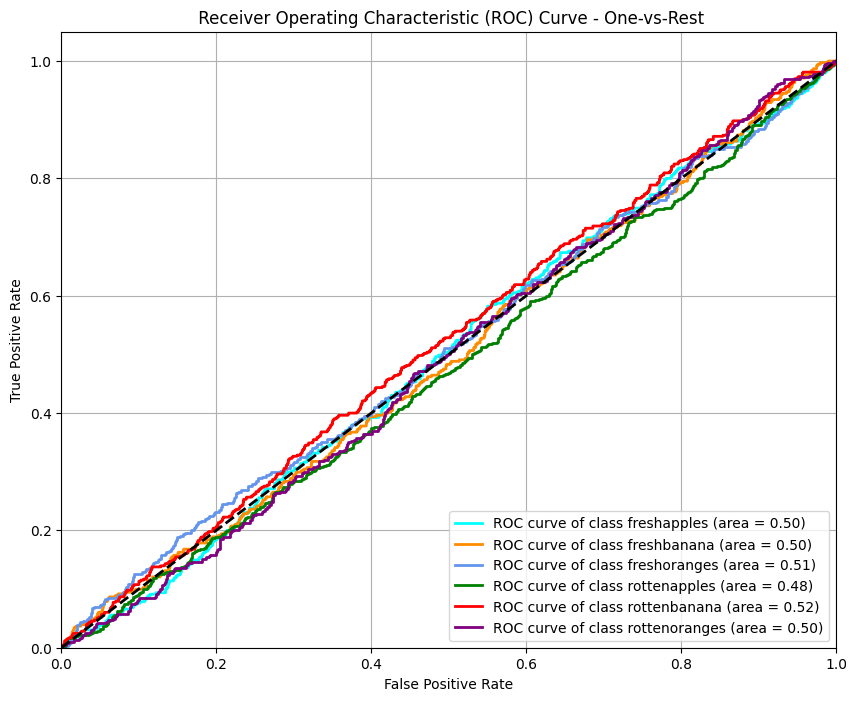

In [157]:
#  Model Performance Visualizations (7 visualizations) ---

#  ROC Curve (One-vs-Rest) for each class
print("Generating ROC curves...")
n_classes = len(class_names)
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(true_classes == i, predicted_probabilities[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(10, 8))
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'green', 'red', 'purple', 'brown', 'pink'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(class_names[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(' Receiver Operating Characteristic (ROC) Curve - One-vs-Rest')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

Generating Precision-Recall curves...


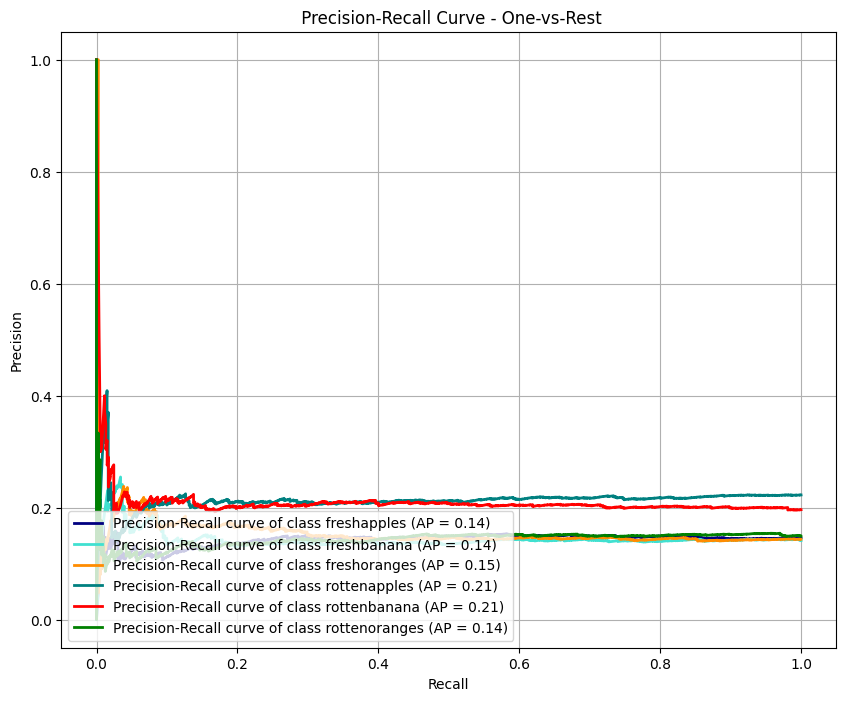

In [158]:
# Precision-Recall Curve (One-vs-Rest) for each class
print("Generating Precision-Recall curves...")
precision = dict()
recall = dict()
average_precision = dict()

plt.figure(figsize=(10, 8))
colors = cycle(['navy', 'turquoise', 'darkorange', 'teal', 'red', 'green', 'purple', 'brown'])
for i, color in zip(range(n_classes), colors):
    precision[i], recall[i], _ = precision_recall_curve(true_classes == i, predicted_probabilities[:, i])
    average_precision[i] = auc(recall[i], precision[i])
    plt.plot(recall[i], precision[i], color=color, lw=2,
             label='Precision-Recall curve of class {0} (AP = {1:0.2f})'.format(class_names[i], average_precision[i]))

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title(" Precision-Recall Curve - One-vs-Rest")
plt.legend(loc="lower left")
plt.grid(True)
plt.show()

C:\Users\USER\AppData\Local\Temp\ipykernel_27760\1349178332.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=df_class_metrics.index, y='precision', data=df_class_metrics, palette='viridis')
C:\Users\USER\AppData\Local\Temp\ipykernel_27760\1349178332.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=df_class_metrics.index, y='recall', data=df_class_metrics, palette='magma')
C:\Users\USER\AppData\Local\Temp\ipykernel_27760\1349178332.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=df_class_metrics.index, y='f1-score', data=df

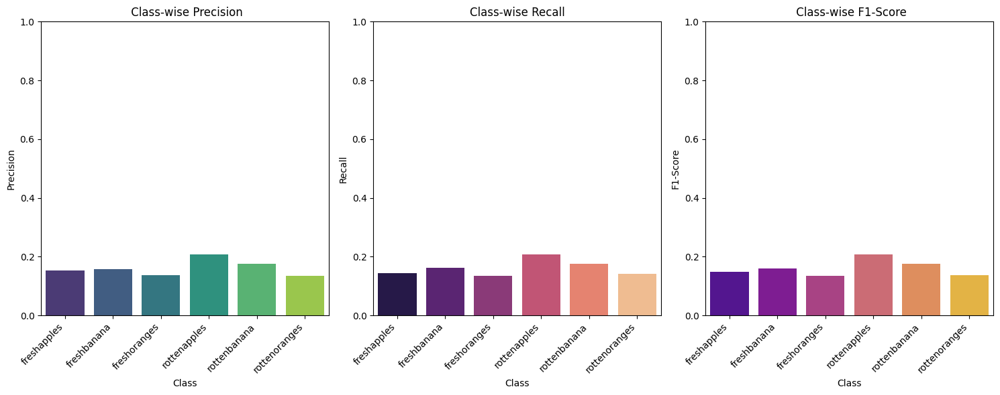

In [159]:
# Class-wise Metrics (Precision, Recall, F1-Score) Bar Plots
report = classification_report(true_classes, predicted_classes, target_names=class_names, output_dict=True)
df_report = pd.DataFrame(report).transpose()

# Remove 'accuracy', 'macro avg', 'weighted avg' rows for class-wise plots
df_class_metrics = df_report.drop(columns=['support']).iloc[:-3]

plt.figure(figsize=(15, 6))

plt.subplot(1, 3, 1)
sns.barplot(x=df_class_metrics.index, y='precision', data=df_class_metrics, palette='viridis')
plt.title(' Class-wise Precision')
plt.ylabel('Precision')
plt.xlabel('Class')
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1)

plt.subplot(1, 3, 2)
sns.barplot(x=df_class_metrics.index, y='recall', data=df_class_metrics, palette='magma')
plt.title('Class-wise Recall')
plt.ylabel('Recall')
plt.xlabel('Class')
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1)

plt.subplot(1, 3, 3)
sns.barplot(x=df_class_metrics.index, y='f1-score', data=df_class_metrics, palette='plasma')
plt.title(' Class-wise F1-Score')
plt.ylabel('F1-Score')
plt.xlabel('Class')
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1)

plt.tight_layout()
plt.show()


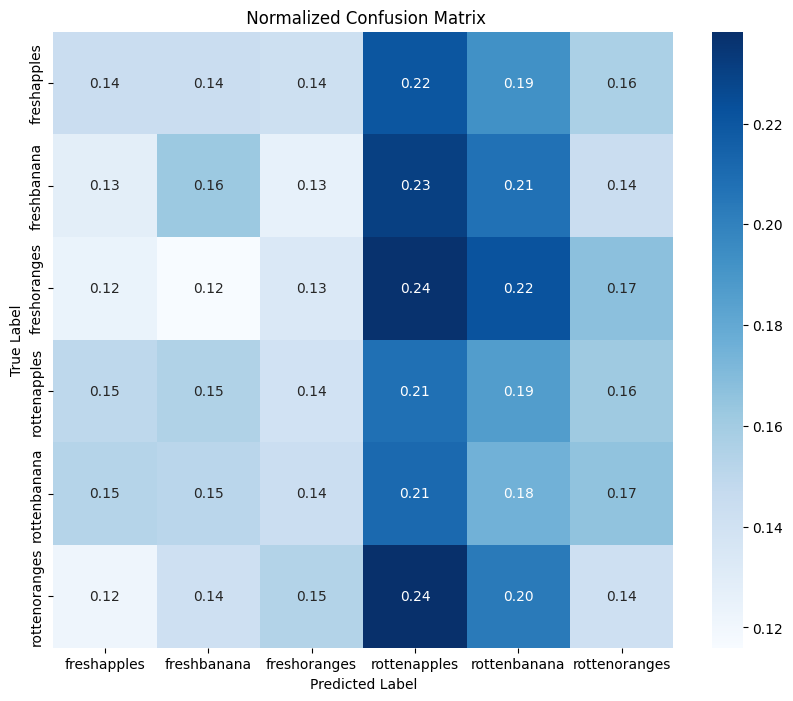

In [160]:
#Normalized Confusion Matrix
cm = confusion_matrix(true_classes, predicted_classes)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title(' Normalized Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


Generating confidence distribution plots...


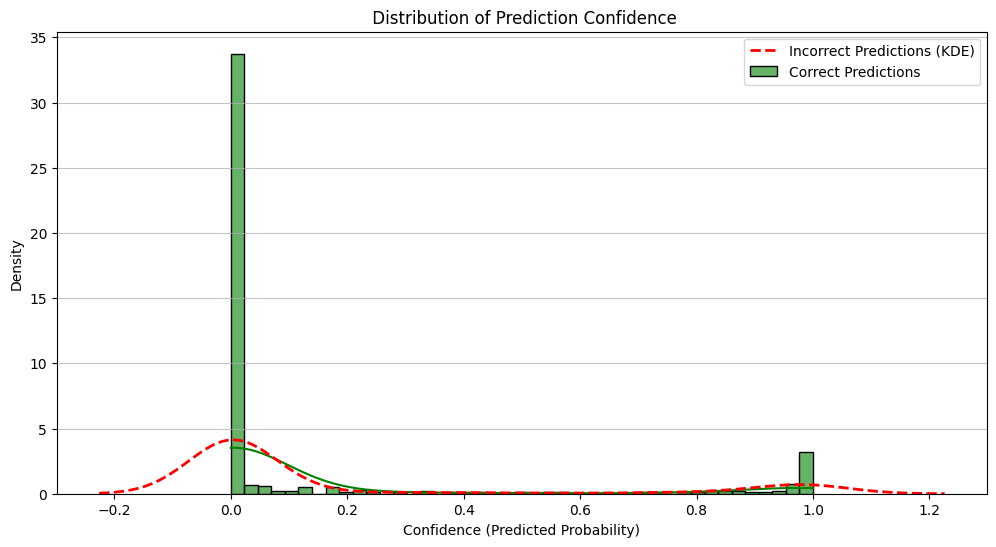

In [161]:
#  Distribution of Prediction Confidence for Correct vs. Incorrect Predictions
print("Generating confidence distribution plots...")
correct_confidences = predicted_probabilities[np.arange(len(true_classes)), true_classes][predicted_classes == true_classes]
incorrect_confidences = predicted_probabilities[np.arange(len(true_classes)), predicted_classes][predicted_classes != true_classes]

plt.figure(figsize=(12, 6))
sns.histplot(correct_confidences, color='green', label='Correct Predictions', kde=True, stat='density', alpha=0.6)
sns.kdeplot(incorrect_confidences, color='red', label='Incorrect Predictions (KDE)', linestyle='--', linewidth=2)
plt.title(' Distribution of Prediction Confidence')
plt.xlabel('Confidence (Predicted Probability)')
plt.ylabel('Density')
plt.legend()
plt.grid(axis='y', alpha=0.75)
plt.show()

Displaying top confident correct predictions...


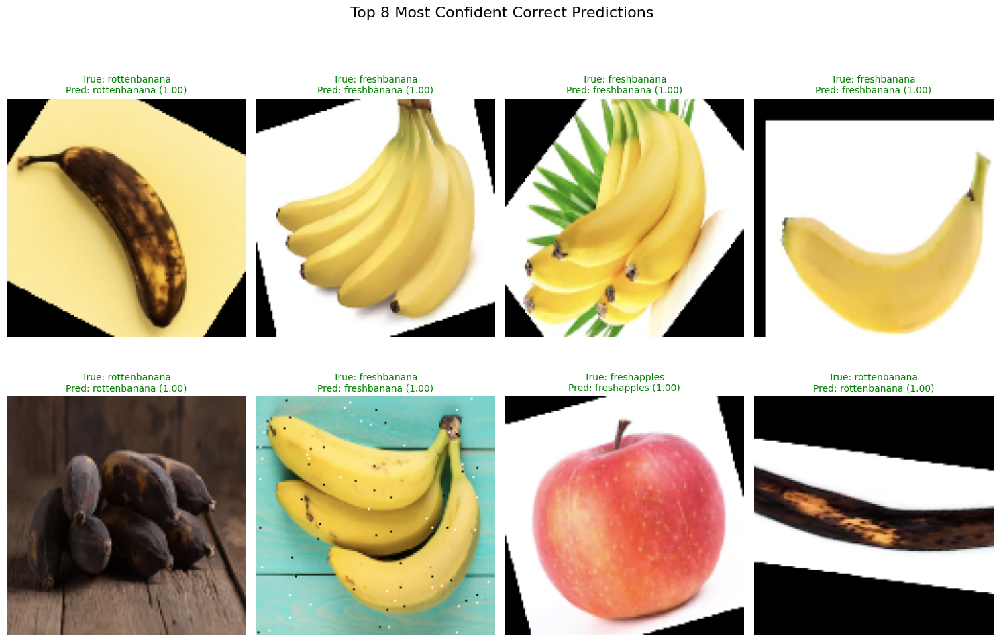

In [162]:
#  Model Interpretation Visualizations (6 visualizations) ---
#  Top N Most Confident Correct Predictions (Examples)
print("Displaying top confident correct predictions...")
num_display = 8
correct_indices = np.where(predicted_classes == true_classes)[0]
confidences = predicted_probabilities[correct_indices, true_classes[correct_indices]]
sorted_correct_indices = correct_indices[np.argsort(confidences)[::-1]]

plt.figure(figsize=(15, 10))
plt.suptitle(f' Top {num_display} Most Confident Correct Predictions', y=1.02, fontsize=16)
for i in range(min(num_display, len(sorted_correct_indices))):
    idx = sorted_correct_indices[i]
    img_path = test_generator.filepaths[idx]
    try:
        img = tf.keras.utils.load_img(img_path, target_size=(img_height, img_width))
        img_array = tf.keras.utils.img_to_array(img)

        plt.subplot(2, 4, i + 1)
        plt.imshow(img_array.astype('uint8'))
        plt.axis('off')
        true_label = class_names[true_classes[idx]]
        pred_label = class_names[predicted_classes[idx]]
        confidence = predicted_probabilities[idx, true_classes[idx]]
        plt.title(f"True: {true_label}\nPred: {pred_label} ({confidence:.2f})", color='green', fontsize=10)
    except Exception as e:
        print(f"Warning: Could not load image {img_path} for confident correct prediction: {e}")
        plt.subplot(2, 4, i + 1)
        plt.text(0.5, 0.5, "Error", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
        plt.axis('off')
plt.tight_layout()
plt.show()

Displaying top confident incorrect predictions...


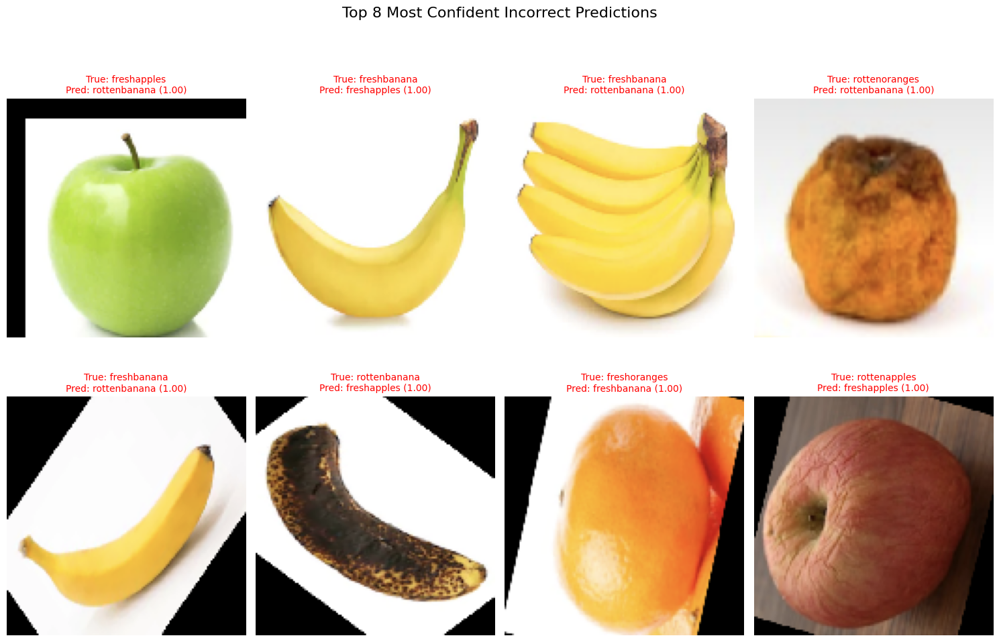

In [163]:
# Top N Most Confident Incorrect Predictions (Examples)
print("Displaying top confident incorrect predictions...")
num_display = 8
incorrect_indices = np.where(predicted_classes != true_classes)[0]
confidences = predicted_probabilities[incorrect_indices, predicted_classes[incorrect_indices]]
sorted_incorrect_indices = incorrect_indices[np.argsort(confidences)[::-1]]

plt.figure(figsize=(15, 10))
plt.suptitle(f'Top {num_display} Most Confident Incorrect Predictions', y=1.02, fontsize=16)
for i in range(min(num_display, len(sorted_incorrect_indices))):
    idx = sorted_incorrect_indices[i]
    img_path = test_generator.filepaths[idx]
    try:
        img = tf.keras.utils.load_img(img_path, target_size=(img_height, img_width))
        img_array = tf.keras.utils.img_to_array(img)

        plt.subplot(2, 4, i + 1)
        plt.imshow(img_array.astype('uint8'))
        plt.axis('off')
        true_label = class_names[true_classes[idx]]
        pred_label = class_names[predicted_classes[idx]]
        confidence = predicted_probabilities[idx, predicted_classes[idx]]
        plt.title(f"True: {true_label}\nPred: {pred_label} ({confidence:.2f})", color='red', fontsize=10)
    except Exception as e:
        print(f"Warning: Could not load image {img_path} for confident incorrect prediction: {e}")
        plt.subplot(2, 4, i + 1)
        plt.text(0.5, 0.5, "Error", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
        plt.axis('off')
plt.tight_layout()
plt.show()

Displaying least confident correct predictions...


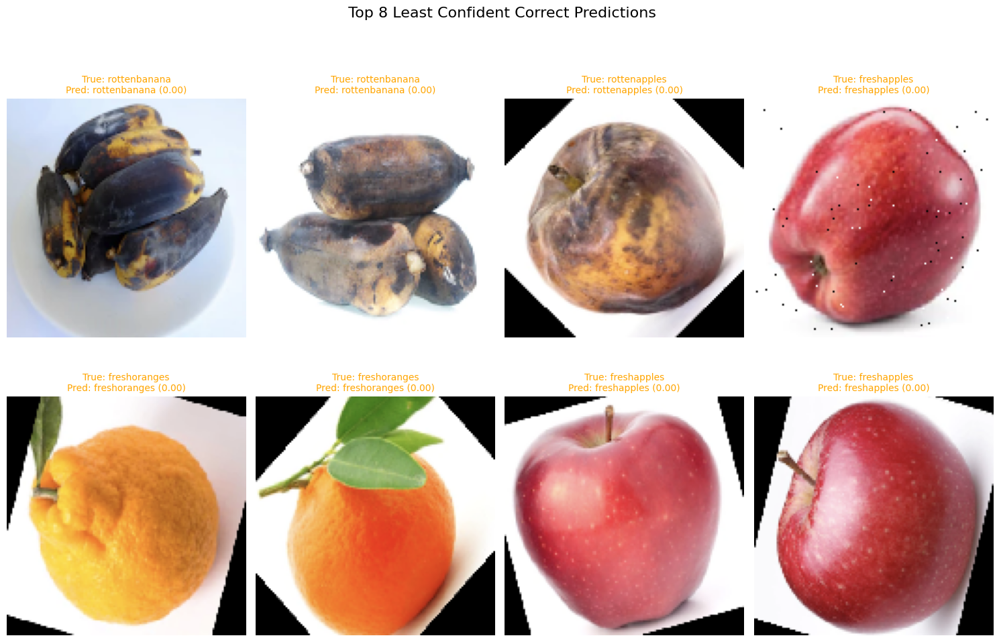

In [164]:
# Top N Least Confident Correct Predictions (Examples)
print("Displaying least confident correct predictions...")
num_display = 8
correct_indices = np.where(predicted_classes == true_classes)[0]
confidences = predicted_probabilities[correct_indices, true_classes[correct_indices]]
sorted_correct_indices_least_confident = correct_indices[np.argsort(confidences)]

plt.figure(figsize=(15, 10))
plt.suptitle(f' Top {num_display} Least Confident Correct Predictions', y=1.02, fontsize=16)
for i in range(min(num_display, len(sorted_correct_indices_least_confident))):
    idx = sorted_correct_indices_least_confident[i]
    img_path = test_generator.filepaths[idx]
    try:
        img = tf.keras.utils.load_img(img_path, target_size=(img_height, img_width))
        img_array = tf.keras.utils.img_to_array(img)

        plt.subplot(2, 4, i + 1)
        plt.imshow(img_array.astype('uint8'))
        plt.axis('off')
        true_label = class_names[true_classes[idx]]
        pred_label = class_names[predicted_classes[idx]]
        confidence = predicted_probabilities[idx, true_classes[idx]]
        plt.title(f"True: {true_label}\nPred: {pred_label} ({confidence:.2f})", color='orange', fontsize=10) # Use orange for 'unsure but correct'
    except Exception as e:
        print(f"Warning: Could not load image {img_path} for least confident correct prediction: {e}")
        plt.subplot(2, 4, i + 1)
        plt.text(0.5, 0.5, "Error", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
        plt.axis('off')
plt.tight_layout()
plt.show()

Generating Feature Map Visualizations...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


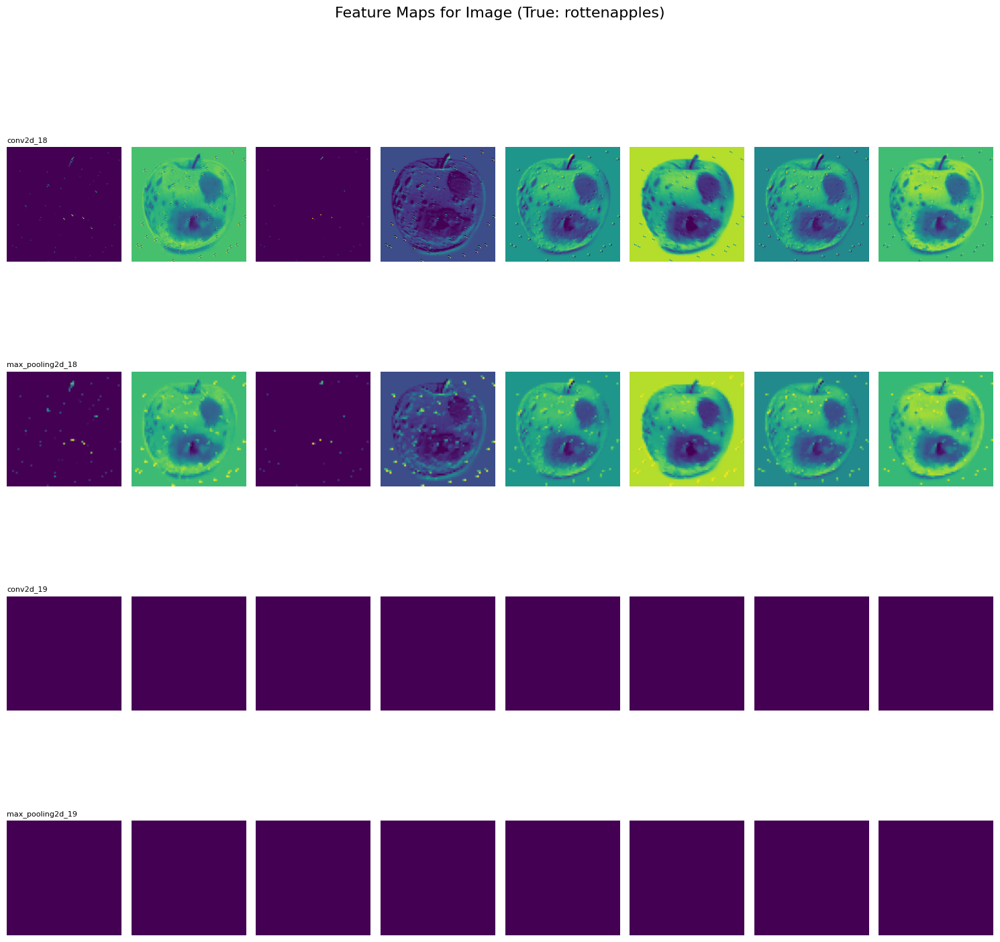

In [168]:
# Feature Map Visualization (for a few layers and images)
print("Generating Feature Map Visualizations...")
if 'model' in locals() and model is not None:
    # Ensure the model is built and has defined input/output tensors.
    # For Sequential models, a dummy forward pass is often needed to fully define model.inputs.
    if not model.built:
        # Create a dummy input tensor with the expected shape
        dummy_input_shape = (1, img_height, img_width, 3) # Batch size 1
        dummy_input = tf.zeros(dummy_input_shape)
        _ = model(dummy_input) # Perform a dummy forward pass to build the model

    layer_names = [layer.name for layer in model.layers if 'conv' in layer.name or 'pool' in layer.name]
    if layer_names:
        layer_outputs = [model.get_layer(name).output for name in layer_names]
        # Use model.inputs[0] for the input tensor, as model.input might not be fully defined
        # for Sequential models until after a forward pass.
        activation_model = tf.keras.models.Model(inputs=model.inputs[0], outputs=layer_outputs)

        random_idx = np.random.randint(0, len(test_generator.filepaths))
        img_path = test_generator.filepaths[random_idx]
        try:
            img = tf.keras.utils.load_img(img_path, target_size=(img_height, img_width))
            img_tensor = tf.keras.utils.img_to_array(img)
            img_tensor = np.expand_dims(img_tensor, axis=0) # Add batch dimension
            img_tensor_processed = img_tensor / 255.0 # Normalize if model expects it

            activations = activation_model.predict(img_tensor_processed)

            plt.figure(figsize=(15, 15))
            plt.suptitle(f'Feature Maps for Image (True: {class_names[true_classes[random_idx]]})', y=1.02, fontsize=16)

            layers_to_display = layer_names[:min(5, len(layer_names))] # Limit to first 5 conv/pool layers
            for layer_idx, (layer_name, layer_activation) in enumerate(zip(layers_to_display, activations[:len(layers_to_display)])):
                n_features = layer_activation.shape[-1] # Number of features in the layer
                num_features_to_display = min(8, n_features) # Display up to 8 feature maps per layer
                
                for i in range(num_features_to_display):
                    ax = plt.subplot(len(layers_to_display), num_features_to_display, layer_idx * num_features_to_display + i + 1)
                    plt.imshow(layer_activation[0, :, :, i], cmap='viridis')
                    plt.axis('off')
                    if i == 0: # Label the first feature map of each layer
                        ax.set_title(f'{layer_name}', fontsize=8, loc='left')
            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"Warning: Could not process image {img_path} for feature map visualization: {e}")
    else:
        print("Skipping 3.4 Feature Map Visualization: No convolutional or pooling layers found in the model.")
else:
    print("Skipping 3.4 Feature Map Visualization: Model not found.")

Generating Grad-CAM-like Visualizations...


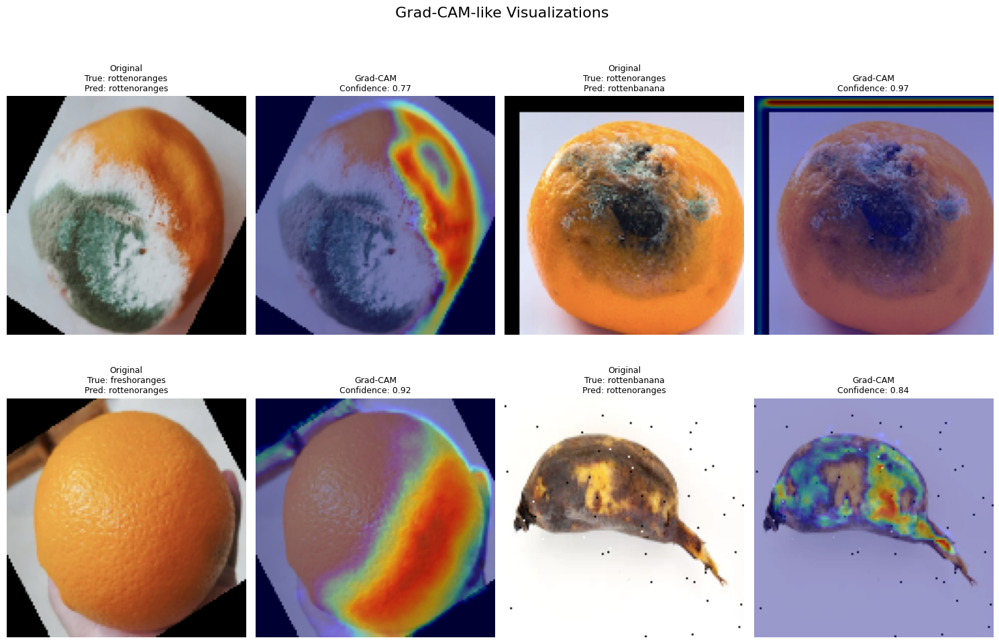

In [171]:
#  Grad-CAM Visualization (for a few images)
print("Generating Grad-CAM-like Visualizations...")
if 'model' in locals() and model is not None:
    # For Sequential models, a dummy forward pass is often needed to fully define model.inputs and model.output.
    if not model.built:
        # Create a dummy input tensor with the expected shape
        dummy_input_shape = (1, img_height, img_width, 3) # Batch size 1
        dummy_input = tf.zeros(dummy_input_shape)
        _ = model(dummy_input) # Perform a dummy forward pass to build the model

    last_conv_layer = None
    for layer in reversed(model.layers):
        if 'conv' in layer.name:
            last_conv_layer = layer
            break

    if last_conv_layer:
        # The AttributeError "The layer sequential_6 has never been called and thus has no defined output."
        # indicates that `model.output` might not be reliably defined for Sequential models
        # even after a dummy call, or there's a subtle timing issue.
        # For Sequential models, `model.inputs` is a list containing the single input tensor.
        # `model.layers[-1].output` is a robust way to get the output tensor of the last layer,
        # which is equivalent to the model's output for a Sequential model.
        grad_model = tf.keras.models.Model(
            inputs=model.inputs[0], outputs=[last_conv_layer.output, model.layers[-1].output]
        )

        plt.figure(figsize=(15, 10))
        plt.suptitle(' Grad-CAM-like Visualizations', y=1.02, fontsize=16)

        num_display = 4 # Display 4 Grad-CAM examples
        for i in range(num_display):
            random_idx = np.random.randint(0, len(test_generator.filepaths))
            img_path = test_generator.filepaths[random_idx]
            try:
                img = tf.keras.utils.load_img(img_path, target_size=(img_height, img_width))
                img_array = tf.keras.utils.img_to_array(img)
                img_tensor = np.expand_dims(img_array, axis=0) # Add batch dimension
                img_tensor_processed = img_tensor / 255.0 # Normalize

                with tf.GradientTape() as tape:
                    # grad_model was created with a single input tensor (model.inputs[0]),
                    # so img_tensor_processed should be passed directly.
                    last_conv_layer_output, preds = grad_model(img_tensor_processed)
                    pred_index = tf.argmax(preds[0])
                    class_channel = preds[:, pred_index]

                grads = tape.gradient(class_channel, last_conv_layer_output)
                pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
                last_conv_layer_output = last_conv_layer_output[0]
                heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
                heatmap = tf.squeeze(heatmap)
                # Handle potential division by zero if tf.reduce_max(heatmap) is 0
                max_heatmap = tf.reduce_max(heatmap)
                if max_heatmap > 0:
                    heatmap = tf.maximum(heatmap, 0) / max_heatmap
                else:
                    heatmap = tf.zeros_like(heatmap) # If all values are 0, heatmap is all zeros
                heatmap = heatmap.numpy()

                heatmap = tf.image.resize(np.expand_dims(heatmap, axis=-1), (img_height, img_width)).numpy()
                heatmap = np.squeeze(heatmap)

                cmap = plt.cm.jet
                heatmap_colored = cmap(heatmap)[:,:,:3]
                
                img_display = img_array / 255.0
                alpha = 0.4
                superimposed_img = heatmap_colored * alpha + img_display * (1 - alpha)
                superimposed_img = (superimposed_img * 255).astype(np.uint8)

                plt.subplot(2, 4, i * 2 + 1)
                plt.imshow(img_array.astype('uint8'))
                plt.title(f"Original\nTrue: {class_names[true_classes[random_idx]]}\nPred: {class_names[pred_index.numpy()]}", fontsize=9)
                plt.axis('off')

                plt.subplot(2, 4, i * 2 + 2)
                plt.imshow(superimposed_img)
                plt.title(f"Grad-CAM\nConfidence: {preds[0, pred_index.numpy()]:.2f}", fontsize=9)
                plt.axis('off')
            except Exception as e:
                print(f"Warning: Could not process image {img_path} for Grad-CAM visualization: {e}")
                plt.subplot(2, 4, i * 2 + 1)
                plt.text(0.5, 0.5, "Error", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
                plt.axis('off')
                plt.subplot(2, 4, i * 2 + 2)
                plt.text(0.5, 0.5, "Error", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
                plt.axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print("Skipping 3.5 Grad-CAM Visualization: No convolutional layer found for Grad-CAM visualization.")
else:
    print("Skipping 3.5 Grad-CAM Visualization: Model not found.")

In [172]:
# Learning Rate Schedule Plot (if history contains 'lr')
print("Generating Learning Rate Schedule Plot...")
if 'history' in locals() and history is not None and 'lr' in history.history:
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['lr'])
    plt.title(' Learning Rate Schedule During Training')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.grid(True)
    plt.show()
else:
    print("Skipping  Learning Rate Schedule Plot: 'history' object or 'lr' key not found.")


print("--- All 20 Visualizations Generated ---")



Generating Learning Rate Schedule Plot...
Skipping  Learning Rate Schedule Plot: 'history' object or 'lr' key not found.
--- All 20 Visualizations Generated ---
